In [1]:
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm

from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import confusion_matrix

import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch import nn,optim

import sklearn.ensemble

%matplotlib inline

## Function

In [2]:
### Perform min-max (0-1) Normalization
def NormalizeData(data):
    return (data - data.min()) / (data.max() - data.min())

In [3]:
### Prepare and split dataset
def my_DataLoader(train_root, test_root, val_split_factor = 0.2, batch_size = 100, batch_all = False, shuffle=True):

    train_df = pd.read_csv(train_root, header=None)
    test_df = pd.read_csv(test_root, header=None)

    train_data = train_df.to_numpy()
    test_data = test_df.to_numpy()

    train_dataset = torch.utils.data.TensorDataset(torch.from_numpy(train_data[:, :-1]).float(),
                                                   torch.from_numpy(train_data[:, -1]).long(),)
    test_dataset = torch.utils.data.TensorDataset(torch.from_numpy(test_data[:, :-1]).float(),
                                                  torch.from_numpy(test_data[:, -1]).long())

    train_len = train_data.shape[0]
    test_len = test_data.shape[0]
    val_len = int(train_len * val_split_factor)
    train_len -= val_len

    train_dataset, val_dataset = torch.utils.data.random_split(train_dataset, [train_len, val_len])

    if batch_all == True:
        train_batch_size = train_len
        val_batch_size = val_len
        test_batch_size = test_len
    else:
        train_batch_size = batch_size
        val_batch_size = batch_size
        test_batch_size = batch_size
        
    train_loader = DataLoader(train_dataset, batch_size=train_batch_size, shuffle=shuffle)
    val_loader = DataLoader(val_dataset, batch_size=val_batch_size, shuffle=shuffle)
    test_loader = DataLoader(test_dataset, batch_size=test_batch_size, shuffle=shuffle)

    return train_loader, val_loader, test_loader

In [4]:
### Version: RNN & GRU & LSTM (with attention)

### Reference: 
# - https://www.analyticsvidhya.com/blog/2021/07/understanding-rnn-step-by-step-with-pytorch/
# - https://towardsdatascience.com/implementation-differences-in-lstm-layers-tensorflow-vs-pytorch-77a31d742f74

### RNN & GRU
# input: Batch Size, Sequence Length, Input Dimension
# output: Tuple(Output, Hidden)
    # output shape: Batch Size, Seq Len, No of Direction * Hidden Size
    # hidden shape: No of Direction * num_layers, Batch Size, Hidden Size

### LSTM
# input: Batch Size, Sequence Length, Input Dimension
# output: Tuple(Output, Tuple(Hidden, Cell))
    # output shape: Batch Size, Seq Len, No of Direction * Hidden Size
    # hidden shape: No of Direction * num_layers, Batch Size, Hidden Size
    # cell shape: No of Direction * num_layers, Batch Size, Hidden Size
            
class RNNModel(nn.Module):
    def __init__(self, input_size=1, hidden_size=64, num_layers=3, 
                 bidirectional=False, attention=False, embed_attention=True, rnn_type='rnn'):
        super(RNNModel, self).__init__()

        self.rnn_type = rnn_type
        if self.rnn_type == 'rnn':
            self.rnn = nn.RNN(input_size=input_size, 
                              hidden_size=hidden_size, 
                              num_layers=num_layers, 
                              bidirectional=bidirectional,
                              batch_first=True)
        elif self.rnn_type == 'gru':
            self.rnn = nn.GRU(input_size=input_size, 
                              hidden_size=hidden_size, 
                              num_layers=num_layers, 
                              bidirectional=bidirectional,
                              batch_first=True)
        elif self.rnn_type == 'lstm':
            self.rnn = nn.LSTM(input_size=input_size, 
                              hidden_size=hidden_size, 
                              num_layers=num_layers, 
                              bidirectional=bidirectional,
                              batch_first=True)
        
        self.bidirectional = bidirectional
        if self.bidirectional == True:
            bidirectional_value = 2
        else:
            bidirectional_value = 1
            
        self.attention = attention
        if self.attention == True:
            attention_value = hidden_size
        else:
            attention_value = 0
        self.embed_attention = embed_attention
            
        #self.classification_layer = nn.Linear((hidden_size * num_layers + attention_value) * bidirectional_value, 5)
        #self.classification_layer = nn.Linear(hidden_size + attention_value * bidirectional_value, 5)
        self.classification_layer = nn.Linear((hidden_size + hidden_size*bidirectional_value if self.attention else num_layers*hidden_size*bidirectional_value), 5)
        
        self.hidden_size = hidden_size
        self.init_hidden = torch.nn.Parameter(torch.zeros((bidirectional_value*num_layers,hidden_size),requires_grad=True))
        self.init_cell = torch.nn.Parameter(torch.zeros((bidirectional_value*num_layers,hidden_size),requires_grad=True))
        self.attention_embed_layer = torch.nn.Linear(bidirectional_value*hidden_size,bidirectional_value*hidden_size)
        
    def forward(self, x, hidden=None,to_print=False):
        if hidden is None:
            hidden = self.init_hidden.unsqueeze(1).repeat(1,x.shape[0],1)
            cell = self.init_cell.unsqueeze(1).repeat(1,x.shape[0],1)
        print("hidden",hidden.shape) if to_print else None
        x = x.unsqueeze(2) 
        if self.rnn_type == 'rnn' or self.rnn_type == 'gru':
            out, hidden = self.rnn(x,hidden)
        elif self.rnn_type == 'lstm':
            out, (hidden, cell) = self.rnn(x,(hidden, cell))
        print("out",out.shape)  if to_print else None
        print("hidden",hidden.shape) if to_print else None
        x = hidden.transpose(0,1)
        x = x.reshape(x.shape[0], -1)
        print("x",x.shape) if to_print else None
        first_top = out[:,0,:self.hidden_size].squeeze(1)
        last_top = out[:,-1,:self.hidden_size].squeeze(1)
        if self.attention: #when using attention use the first time step since it is less correlated with the last time steps
            for_classification = first_top
        else:
            for_classification = x
        print("first top",first_top.shape) if to_print else None
    
        # attention
        if self.attention == True:
            x_attn = hidden.permute(1,2,0)
            print("x_attn",x_attn.shape) if to_print else None
            if self.bidirectional == True:
                #x_attn = x_attn.reshape(x_attn.shape[0], -1, int(x_attn.shape[2]/2))
                x_attn = torch.cat((x_attn[:,:,range(0,x_attn.shape[2],2)],x_attn[:,:,range(1,x_attn.shape[2],2)]),dim=1)
                print("x_attn",x_attn.shape) if to_print else None
            if self.embed_attention:
                x_attn = self.attention_embed_layer(x_attn.transpose(2,1)).transpose(2,1)
            self.w_attn_before_softmax = out.bmm(x_attn).sum(axis=2)
            print("out bmm",out.bmm(x_attn).shape) if to_print else None
            print("w_attn",self.w_attn_before_softmax.shape) if to_print else None
            self.w_attn = F.softmax(self.w_attn_before_softmax, dim=1)
            print("self.w_attn",self.w_attn.shape) if to_print else None
            c = out.permute(0, 2, 1).bmm(self.w_attn.unsqueeze(2)).squeeze(-1)
            print("c",c.shape) if to_print else None
            x = torch.concat([x, c], axis=1)
            for_classification = torch.concat([first_top,c],axis=1)
        
        print("for_classification",for_classification.shape) if to_print else None
        #x = self.classification_layer(x)
        x = self.classification_layer(for_classification)
        return x

In [5]:
### Evaluate the model accuracy
def evaluate(model, loader):
    model.eval()

    correct = 0
    total = len(loader.dataset)
    val_bar = tqdm(loader, file=sys.stdout)
    for x, y in val_bar:
        x, y = x.to(device), y.to(device)
        with torch.no_grad():
            logits = model(x)
            pred = logits.argmax(dim=1)
        correct += torch.eq(pred, y).sum().float().item()

    return correct / total

## Configuration

In [6]:
import datetime
timestamp = datetime.datetime.now().strftime("%Y-%m-%d_%H_%M_%S")

In [7]:
### Configuration
# Dataset path
train_set_path = '../data/mitbih_train.csv'
test_set_path = '../data/mitbih_test.csv'
train_set_path = 'mitbih_train.csv'
test_set_path = 'mitbih_test.csv'

# Result file name
best_model_file_name = 'best.mdl'
best_model_file_name = timestamp + '_best.mdl'
downstream_best_model_file_name = 'downstream_best.mdl'
data_for_viz_file_name = 'data_for_viz'
label_for_viz_file_name = 'label_for_viz'
w_attn_file_name = 'w_attn'
w_attn_before_softmax_file_name = 'w_attn_before_softmax'
attention_weight_plot_file_name = 'rnn_attention_weight_vs_heart_beat'

# RNN parameters
# rnn_input_size = 1
# rnn_hidden_size = 128
# rnn_num_layers = 4
# rnn_bidirectional = True
# rnn_attention = True
# rnn_type = 'rnn'

rnn_input_size = 1
rnn_hidden_size = 256
rnn_num_layers = 12
rnn_bidirectional = True
rnn_attention = False
rnn_type = 'rnn'

# Other parameters
# torch.manual_seed(1234)
# batch_size=1000
# batch_all=False
# lr = 3e-3
# epochs = 15
# val_split_factor = 0.2 # Train-validation split ratio
# no_total_features = 187
# percent_kept_top_features = 50 # Downstream task (zero out)
# no_kept_top_features = int(percent_kept_top_features / 100 * no_total_features)
torch.manual_seed(1234)
batch_size=256
batch_all=False
lr = 1e-4
epochs = 50
val_split_factor = 0.2 # Train-validation split ratio
no_total_features = 187
percent_kept_top_features = 50 # Downstream task (zero out)
no_kept_top_features = int(percent_kept_top_features / 100 * no_total_features)

# Set device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("using {} device.".format(device))

best_model_file_name = timestamp + "_{}_{}_{}_att{}".format(rnn_type,rnn_hidden_size,rnn_num_layers,str(rnn_attention))+'_best.mdl'

# best_model_file_name = "2022-04-28_18_48_13_gru_256_12_attTrue_best.mdl" #gru attention model
# best_model_file_name = "2022-04-29_02_18_26_lstm_256_12_attTrue_best.mdl" #lstm attention model
# best_model_file_name = "2022-04-28_20_26_58_rnn_256_12_attTrue_best.mdl" #rnn attention model
# best_model_file_name = "2022-04-29_13_59_04_gru_256_12_attFalse_best.mdl" #gru no attention

using cuda:0 device.


## Model Training

In [8]:
### Prepare train, validation, test set

# No. Train: 87554
#     No. Split Train: 70044
#     No. Split Validation: 17510
# No. Test: 21892

train_loader, val_loader, test_loader = my_DataLoader(train_set_path,
                                                      test_set_path,
                                                      val_split_factor=val_split_factor,
                                                      batch_size=batch_size,
                                                      batch_all=batch_all)

In [9]:
### Initialize RNN model
model = RNNModel(input_size=rnn_input_size, 
                 hidden_size=rnn_hidden_size, 
                 num_layers=rnn_num_layers,
                 bidirectional=rnn_bidirectional, 
                 attention=rnn_attention, 
                 rnn_type=rnn_type).to(device)
optimizer = optim.Adam(model.parameters(), lr=lr)

# from collections import Counter
# train_label_freqs = Counter(sum([list(y.cpu().detach().numpy()) for x,y in train_loader],[]))
# print(train_label_freqs)
# loss_weights = np.array([1.0/train_label_freqs[i] for i in range(5)])
# loss_weights = (loss_weights/np.sum(loss_weights)).astype(np.float32)
#criterion = nn.CrossEntropyLoss(torch.tensor(loss_weights).to(device))
criterion = nn.CrossEntropyLoss()

best_acc, best_epoch = 0, 0
global_step = 0

In [10]:
### Train model
for epoch in range(epochs):

    train_bar = tqdm(train_loader, file=sys.stdout)
    for step, (x, y) in enumerate(train_bar):
        x, y = x.to(device), y.to(device)
        #x, y = x.unsqueeze(-1).to(device), y.to(device)

        model.train()
        logits = model(x)
        loss = criterion(logits, y)

        optimizer.zero_grad()
        loss.backward()

        optimizer.step()

        train_bar.desc = "train epoch[{}/{}] loss:{:.3f}".format(epoch + 1,
                                                                 epochs,
                                                                 loss)

        global_step += 1

    if epoch % 1 == 0:

        val_acc = evaluate(model, val_loader)
        print('val_acc = ',val_acc)
        if val_acc > best_acc:
            best_epoch = epoch
            best_acc = val_acc
            
            # Save best model
            torch.save(model.state_dict(), best_model_file_name)

print('##############################################')
print('best acc:', best_acc, 'best epoch:', best_epoch)

model.load_state_dict(torch.load(best_model_file_name))
print('Load best model from checkpoint!')

test_acc = evaluate(model, test_loader)
print('test acc:', test_acc)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 69/69 [00:03<00:00, 17.52it/s]
val_acc =  0.9428326670474015
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 69/69 [00:03<00:00, 17.88it/s]
val_acc =  0.9511707595659623
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 69/69 [00:04<00:00, 16.62it/s]
val_acc =  0.9513992004568818
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 69/69 [00:03<00:00, 18.22it/s]
val_acc =  0.9585950885208452
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 69/69 [00:03<00:00, 18.80it/s]
val_acc =  0.9782410051399201
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 69/69 [00:03<00:00, 17.64it/s]
val_acc =  0.9773272415762422
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 69/69 [00:04<00:00, 16.25it/s]
val_acc =  0.9789834380354083
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 69/69 [00:03<00:00, 18.70it/s]
val_acc =  0.9772701313535123
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 69/69 [00:03<00:00, 19.62it/s]
val_acc =  0.9796116504854369
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 69/69 [00:03<00:00, 18.64it/s]
val_acc =  0.9778983438035408
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 69/69 [00:03<00:00, 17.28it/s]
val_acc =  0.9800114220445459
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 69/69 [00:03<00:00, 18.83it/s]
val_acc =  0.9768132495716734
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████

In [8]:
### Get Accuracy / Precision / Recall / F1 Score
eval_model = RNNModel(input_size=rnn_input_size, 
                 hidden_size=rnn_hidden_size, 
                 num_layers=rnn_num_layers,
                 bidirectional=rnn_bidirectional, 
                 attention=rnn_attention, 
                 rnn_type=rnn_type).to(device)
eval_model.load_state_dict(torch.load(best_model_file_name))
eval_model.eval()

# Prepare test set
test_df = pd.read_csv(test_set_path, header=None)
test_data = test_df.to_numpy()
test_dataset = torch.utils.data.TensorDataset(torch.from_numpy(test_data[:, :-1]).float(),
                                              torch.from_numpy(test_data[:, -1]).long())
#test_loader = DataLoader(test_dataset, batch_size=len(test_dataset), shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=256, shuffle=False)

xs = []
ys = []
preds = []

for x, y in test_loader:
    x,y = x.to(device),y.to(device)
    logits = eval_model(x)
    pred = logits.argmax(dim=1)
    true = y
    preds += list(pred.cpu().detach().numpy())
    xs += list(x.cpu().detach().numpy())
    ys += list(y.cpu().detach().numpy())

    # Save attention weight (both before and after softmax)
    print(f'Shape of data_for_viz : {x.shape}')
    print(f'Shape of label_for_viz : {y.shape}')
    if eval_model.attention:
        print(f'Shape of w_attn : {eval_model.w_attn.shape}')
        print(f'Shape of w_attn_before_softmax : {eval_model.w_attn_before_softmax.shape}')
    
#     torch.save(x, data_for_viz_file_name + "_test")
#     torch.save(y, label_for_viz_file_name + "_test")
#     torch.save(eval_model.w_attn.detach(), w_attn_file_name + "_test")
#     torch.save(eval_model.w_attn_before_softmax.detach(), w_attn_before_softmax_file_name + "_test")
#torch.save(x,)
average_metric = 'macro'
print("Confusion matrix")
print(confusion_matrix(y_true=ys, y_pred=preds))
print(f"Accuracy: {accuracy_score(ys, preds)}")
print(f"Precision: {precision_score(ys, preds, average=average_metric)}")
print(f"Recall: {recall_score(ys, preds, average=average_metric)}")
print(f"F1: {f1_score(ys, preds, average=average_metric)}")

Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

Shape of data_for_viz : torch.Size([256, 187])
Shape of labe

Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

Shape of data_for_viz : torch.Size([256, 187])
Shape of labe

In [ ]:
### Get Accuracy / Precision / Recall / F1 Score
# eval_model = RNNModel(input_size=rnn_input_size, 
#                  hidden_size=rnn_hidden_size, 
#                  num_layers=rnn_num_layers,
#                  bidirectional=rnn_bidirectional, 
#                  attention=rnn_attention, 
#                  rnn_type=rnn_type).to(device)
# eval_model.load_state_dict(torch.load(best_model_file_name))
eval_model = model
eval_model.eval()

# Prepare test set
test_df = pd.read_csv(test_set_path, header=None)
test_data = test_df.to_numpy()
test_dataset = torch.utils.data.TensorDataset(torch.from_numpy(test_data[:, :-1]).float(),
                                              torch.from_numpy(test_data[:, -1]).long())
#test_loader = DataLoader(test_dataset, batch_size=len(test_dataset), shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=256, shuffle=False)

xs = []
ys = []
preds = []

for x, y in test_loader:
    x,y = x.to(device),y.to(device)
    logits = eval_model(x)
    pred = logits.argmax(dim=1)
    true = y
    preds += list(pred.cpu().detach().numpy())
    xs += list(x.cpu().detach().numpy())
    ys += list(y.cpu().detach().numpy())

    # Save attention weight (both before and after softmax)
    print(f'Shape of data_for_viz : {x.shape}')
    print(f'Shape of label_for_viz : {y.shape}')
    if eval_model.attention:
        print(f'Shape of w_attn : {eval_model.w_attn.shape}')
        print(f'Shape of w_attn_before_softmax : {eval_model.w_attn_before_softmax.shape}')
    
#     torch.save(x, data_for_viz_file_name + "_test")
#     torch.save(y, label_for_viz_file_name + "_test")
#     torch.save(eval_model.w_attn.detach(), w_attn_file_name + "_test")
#     torch.save(eval_model.w_attn_before_softmax.detach(), w_attn_before_softmax_file_name + "_test")
#torch.save(x,)
average_metric = 'macro'
print("Confusion matrix")
print(confusion_matrix(y_true=ys, y_pred=preds))
print(f"Accuracy: {accuracy_score(ys, preds)}")
print(f"Precision: {precision_score(ys, preds, average=average_metric)}")
print(f"Recall: {recall_score(ys, preds, average=average_metric)}")
print(f"F1: {f1_score(ys, preds, average=average_metric)}")

In [12]:
import os
os.makedirs

<function os.makedirs(name, mode=511, exist_ok=False)>

In [13]:
viz_folder = "attention_viz/lstm_att"

In [14]:
os.makedirs(viz_folder)

In [15]:
os.makedirs(os.path.join(viz_folder,"train"))

In [16]:
os.makedirs(os.path.join(viz_folder,"test"))

In [17]:
### Final run model with all training set (to obtain attention weights for all training data points)
# Note: My kernel died when running with too many batch size
viz_model = RNNModel(input_size=rnn_input_size, 
                 hidden_size=rnn_hidden_size, 
                 num_layers=rnn_num_layers,
                 bidirectional=rnn_bidirectional, 
                 attention=rnn_attention, 
                 rnn_type=rnn_type).to(device)
viz_model.load_state_dict(torch.load(best_model_file_name))

batch_size_final = 256
batch_all_final = False
shuffle_final = False
train_loader, val_loader, test_loader = my_DataLoader(train_set_path,
                                                      test_set_path,
                                                      val_split_factor=val_split_factor,
                                                      batch_size=batch_size_final,
                                                      batch_all=batch_all_final,
                                                      shuffle=shuffle_final)

w_attn_list = []
w_attn_before_softmax_list = []
for step, (x, y) in enumerate(train_loader):
    x, y = x.to(device), y.to(device)
    
    viz_model.eval()
    logits = viz_model(x)
    
    # Save attention weight (both before and after softmax)
    print(f'############## Step: {step} ##############')
    print(f'Shape of data_for_viz : {x.shape}')
    print(f'Shape of label_for_viz : {y.shape}')
    print(f'Shape of w_attn : {viz_model.w_attn.shape}')
    print(f'Shape of w_attn_before_softmax : {viz_model.w_attn_before_softmax.shape}')
    print()
    
    torch.save(x, os.path.join(viz_folder,"train",data_for_viz_file_name + "_train_" + str(step)))
    torch.save(y, os.path.join(viz_folder,"train",label_for_viz_file_name + "_train_" + str(step)))
    torch.save(viz_model.w_attn.detach(), os.path.join(viz_folder,"train",w_attn_file_name + "_train_" + str(step)))
    torch.save(viz_model.w_attn_before_softmax.detach(), os.path.join(viz_folder,"train",w_attn_before_softmax_file_name + "_train_" + str(step)))

############## Step: 0 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 1 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 2 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 3 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 4 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of la

############## Step: 38 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 39 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 40 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 41 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 42 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape 

############## Step: 75 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 76 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 77 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 78 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 79 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape 

############## Step: 112 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 113 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 114 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 115 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 116 ##############
Shape of data_for_viz : torch.Size([256, 187])
S

############## Step: 148 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 149 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 150 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 151 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 152 ##############
Shape of data_for_viz : torch.Size([256, 187])
S

############## Step: 184 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 185 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 186 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 187 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 188 ##############
Shape of data_for_viz : torch.Size([256, 187])
S

############## Step: 221 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 222 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 223 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 224 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 225 ##############
Shape of data_for_viz : torch.Size([256, 187])
S

############## Step: 257 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 258 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 259 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 260 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 261 ##############
Shape of data_for_viz : torch.Size([256, 187])
S

In [21]:
for step, (x, y) in enumerate(test_loader):
    x, y = x.to(device), y.to(device)
    
    viz_model.eval()
    logits = viz_model(x)
    
    # Save attention weight (both before and after softmax)
    print(f'############## Step: {step} ##############')
    print(f'Shape of data_for_viz : {x.shape}')
    print(f'Shape of label_for_viz : {y.shape}')
    print(f'Shape of w_attn : {viz_model.w_attn.shape}')
    print(f'Shape of w_attn_before_softmax : {viz_model.w_attn_before_softmax.shape}')
    print()
    
    torch.save(x, os.path.join(viz_folder,"test",data_for_viz_file_name + "_test_" + str(step)))
    torch.save(y, os.path.join(viz_folder,"test",label_for_viz_file_name + "_test_" + str(step)))
    torch.save(viz_model.w_attn.detach(), os.path.join(viz_folder,"test",w_attn_file_name + "_test_" + str(step)))
    torch.save(viz_model.w_attn_before_softmax.detach(), os.path.join(viz_folder,"test",w_attn_before_softmax_file_name + "_test_" + str(step)))

############## Step: 0 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 1 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 2 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 3 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 4 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of la

############## Step: 38 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 39 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 40 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 41 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 42 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape 

############## Step: 76 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 77 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 78 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 79 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape of label_for_viz : torch.Size([256])
Shape of w_attn : torch.Size([256, 187])
Shape of w_attn_before_softmax : torch.Size([256, 187])

############## Step: 80 ##############
Shape of data_for_viz : torch.Size([256, 187])
Shape 

In [20]:
### Combine and get the final attention weight
num_att_splits = len(os.listdir(os.path.join(viz_folder,"train")))//4
data_for_viz_train_list = [torch.load(os.path.join(viz_folder,"train",data_for_viz_file_name + "_train_%d"%i)) for i in range(num_att_splits)]
label_for_viz_train_list = [torch.load(os.path.join(viz_folder,"train",label_for_viz_file_name + "_train_%d"%i)) for i in range(num_att_splits)]
w_attn_train_list = [torch.load(os.path.join(viz_folder,"train",w_attn_file_name + "_train_%d"%i)) for i in range(num_att_splits)]
w_attn_before_softmax_train_list = [torch.load(os.path.join(viz_folder,"train",w_attn_before_softmax_file_name + "_train_%d"%i)) for i in range(num_att_splits)]

data_for_viz_train = torch.concat(data_for_viz_train_list)
label_for_viz_train = torch.concat(label_for_viz_train_list)
w_attn_train = torch.concat(w_attn_train_list)
w_attn_before_softmax_train = torch.concat(w_attn_before_softmax_train_list)

# Save attention weight (both before and after softmax)
print(f'Shape of data_for_viz : {data_for_viz_train.shape}')
print(f'Shape of label_for_viz : {label_for_viz_train.shape}')
print(f'Shape of w_attn : {w_attn_train.shape}')
print(f'Shape of w_attn_before_softmax : {w_attn_before_softmax_train.shape}')

torch.save(data_for_viz_train, os.path.join(viz_folder,data_for_viz_file_name + "_train"))
torch.save(label_for_viz_train, os.path.join(viz_folder,label_for_viz_file_name + "_train"))
torch.save(w_attn_train, os.path.join(viz_folder,w_attn_file_name + "_train"))
torch.save(w_attn_before_softmax_train, os.path.join(viz_folder,w_attn_before_softmax_file_name + "_train"))

Shape of data_for_viz : torch.Size([70044, 187])
Shape of label_for_viz : torch.Size([70044])
Shape of w_attn : torch.Size([70044, 187])
Shape of w_attn_before_softmax : torch.Size([70044, 187])


In [22]:
num_att_splits = len(os.listdir(os.path.join(viz_folder,"test")))//4
data_for_viz_test_list = [torch.load(os.path.join(viz_folder,"test",data_for_viz_file_name + "_test_%d"%i)) for i in range(num_att_splits)]
label_for_viz_test_list = [torch.load(os.path.join(viz_folder,"test",label_for_viz_file_name + "_test_%d"%i)) for i in range(num_att_splits)]
w_attn_test_list = [torch.load(os.path.join(viz_folder,"test",w_attn_file_name + "_test_%d"%i)) for i in range(num_att_splits)]
w_attn_before_softmax_test_list = [torch.load(os.path.join(viz_folder,"test",w_attn_before_softmax_file_name + "_test_%d"%i)) for i in range(num_att_splits)]

data_for_viz_test = torch.concat(data_for_viz_test_list)
label_for_viz_test = torch.concat(label_for_viz_test_list)
w_attn_test = torch.concat(w_attn_test_list)
w_attn_before_softmax_test = torch.concat(w_attn_before_softmax_test_list)

# Save attention weight (both before and after softmax)
print(f'Shape of data_for_viz : {data_for_viz_test.shape}')
print(f'Shape of label_for_viz : {label_for_viz_test.shape}')
print(f'Shape of w_attn : {w_attn_test.shape}')
print(f'Shape of w_attn_before_softmax : {w_attn_before_softmax_test.shape}')

torch.save(data_for_viz_test, os.path.join(viz_folder,data_for_viz_file_name + "_test"))
torch.save(label_for_viz_test, os.path.join(viz_folder,label_for_viz_file_name + "_test"))
torch.save(w_attn_test, os.path.join(viz_folder,w_attn_file_name + "_test"))
torch.save(w_attn_before_softmax_test, os.path.join(viz_folder,w_attn_before_softmax_file_name + "_test"))

Shape of data_for_viz : torch.Size([21892, 187])
Shape of label_for_viz : torch.Size([21892])
Shape of w_attn : torch.Size([21892, 187])
Shape of w_attn_before_softmax : torch.Size([21892, 187])


## Visualization

In [23]:
data_for_viz_train = torch.load(os.path.join(viz_folder,data_for_viz_file_name + "_train")).cpu().detach().numpy()
label_for_viz_train = torch.load(os.path.join(viz_folder,label_for_viz_file_name + "_train")).cpu().detach().numpy()
w_attn_train = torch.load(os.path.join(viz_folder,w_attn_file_name + "_train")).cpu().detach().numpy()
w_attn_before_softmax_train = torch.load(os.path.join(viz_folder,w_attn_before_softmax_file_name + "_train")).cpu().detach().numpy()


In [24]:
data_for_viz_test = torch.load(os.path.join(viz_folder,data_for_viz_file_name + "_test")).cpu().detach().numpy()
label_for_viz_test = torch.load(os.path.join(viz_folder,label_for_viz_file_name + "_test")).cpu().detach().numpy()
w_attn_test = torch.load(os.path.join(viz_folder,w_attn_file_name + "_test")).cpu().detach().numpy()
w_attn_before_softmax_test = torch.load(os.path.join(viz_folder,w_attn_before_softmax_file_name + "_test")).cpu().detach().numpy()


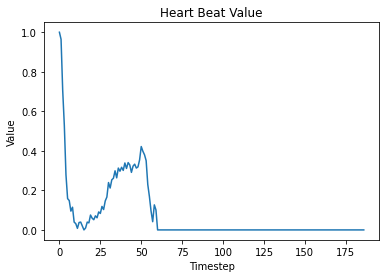

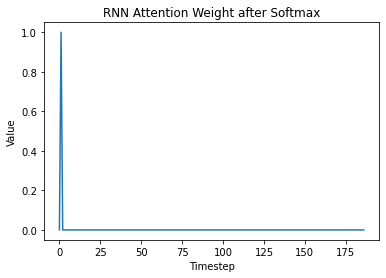

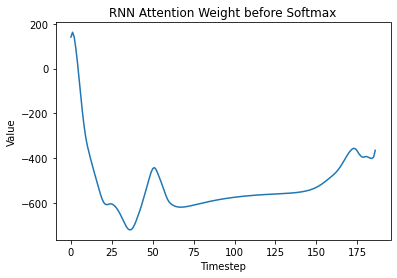

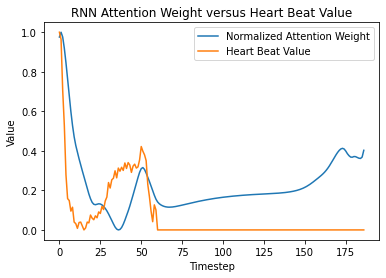

In [27]:
# Plot attention weight vs heart beat value
data_index = 3

#data_for_viz_train = torch.load(data_for_viz_file_name + "_train_8").cpu()
#w_attn_train = torch.load(w_attn_file_name + "_train_8").cpu()
#w_attn_before_softmax_train = torch.load(w_attn_before_softmax_file_name + "_train_8").cpu()

plt.title('Heart Beat Value')
plt.xlabel('Timestep')
plt.ylabel('Value')
plt.plot(np.arange(data_for_viz_train.shape[1]), data_for_viz_train[data_index])
plt.show()

plt.title('RNN Attention Weight after Softmax')
plt.xlabel('Timestep')
plt.ylabel('Value')
plt.plot(np.arange(w_attn_train.shape[1]), w_attn_train[data_index])
plt.show()

plt.title('RNN Attention Weight before Softmax')
plt.xlabel('Timestep')
plt.ylabel('Value')
plt.plot(np.arange(w_attn_before_softmax_train.shape[1]), w_attn_before_softmax_train[data_index])
plt.show()

plt.title('RNN Attention Weight versus Heart Beat Value')
plt.xlabel('Timestep')
plt.ylabel('Value')
plt.plot(np.arange(w_attn_before_softmax_train.shape[1]), 
         NormalizeData(w_attn_before_softmax_train[data_index]), 
         label='Normalized Attention Weight')
plt.plot(np.arange(data_for_viz_train.shape[1]), data_for_viz_train[data_index], label='Heart Beat Value')
plt.legend()
plt.savefig(attention_weight_plot_file_name)
plt.show()

In [25]:
# Plot attention weight vs heart beat value
def viz_att_plots(data_index,save_file=None,data_for_viz_train=None):

    fig = plt.figure(figsize=(6,25))
    subp = fig.add_subplot(4,1,1)
    plt.title('Heart Beat Value')
    subp.set_xlabel('Timestep')
    subp.set_ylabel('Value')
    subp.plot(np.arange(data_for_viz_train.shape[1]), data_for_viz_train[data_index])
    #plt.show()

    subp = fig.add_subplot(4,1,2)
    plt.title('RNN Attention Weight after Softmax')
    subp.set_xlabel('Timestep')
    subp.set_ylabel('Value')
    subp.plot(np.arange(w_attn_train.shape[1]), w_attn_train[data_index])
    #plt.show()

    subp = fig.add_subplot(4,1,3)
    plt.title('RNN Attention Weight before Softmax')
    subp.set_xlabel('Timestep')
    subp.set_ylabel('Value')
    subp.plot(np.arange(w_attn_before_softmax_train.shape[1]), w_attn_before_softmax_train[data_index])
    #plt.show()

    subp = fig.add_subplot(4,1,4)
    plt.title('RNN Attention Weight versus Heart Beat Value')
    subp.set_xlabel('Timestep')
    subp.set_ylabel('Value')
    subp.plot(np.arange(w_attn_before_softmax_train.shape[1]), 
             NormalizeData(w_attn_before_softmax_train[data_index]), 
             label='Normalized Attention Weight')
    subp.plot(np.arange(data_for_viz_train.shape[1]), data_for_viz_train[data_index], label='Heart Beat Value')
    subp.legend()
    #plt.show()
    
    if save_file is None:
        plt.show()
    else:
        plt.savefig(save_file)

In [26]:
os.makedirs(os.path.join(viz_folder,"plots"))

In [27]:
os.makedirs(os.path.join(viz_folder,"plots","train"))

In [28]:
os.makedirs(os.path.join(viz_folder,"plots","test"))

In [ ]:
# for i,label in enumerate(label_for_viz_train):
#     label_folder = os.path.join(viz_folder,"plots","train",str(label))
#     if not os.path.exists(label_folder):
#         os.makedirs(label_folder)
#     viz_att_plots(i,os.path.join(label_folder,"%d.png"%i))
#     plt.close()

0 453 0
0 38914 0
0 38213 0
0 41134 0
0 51824 0
0 43922 0
0 36330 0
0 373 0
0 1528 0
0 44884 0
1 14483 1
1 2449 1
1 13840 1
1 38335 1
1 32289 1
1 55486 1
1 12086 1
1 70031 1
1 58339 1
1 4444 1


/tmp/ipykernel_2168550/1056424790.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(6,25))


2 64545 2
2 19935 2
2 24299 2
2 6402 2
2 15960 2
2 21881 2
2 7149 2
2 64708 2
2 36663 2
2 35945 2
3 42261 3
3 45611 3
3 67130 3
3 68310 3
3 48829 3
3 52747 3
3 58723 3
3 1936 3
3 36883 3
3 32321 3
4 2221 4
4 44156 4
4 47065 4
4 44567 4
4 13026 4
4 67055 4
4 17452 4
4 44149 4
4 53895 4
4 55708 4


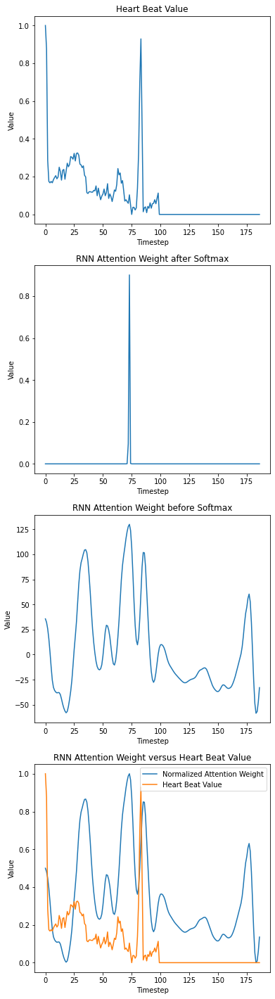

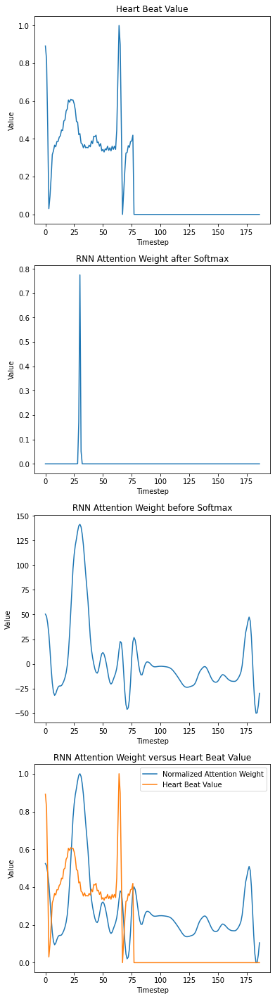

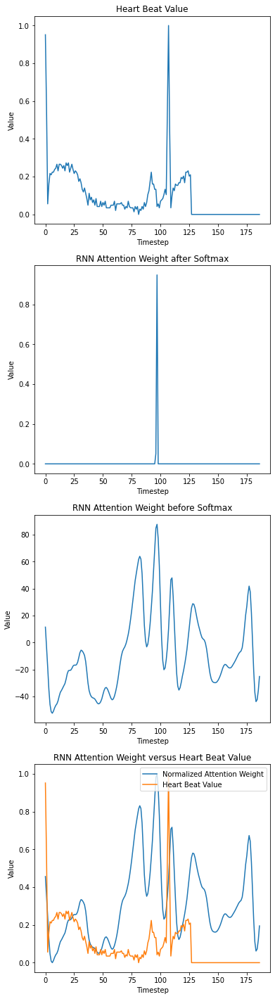

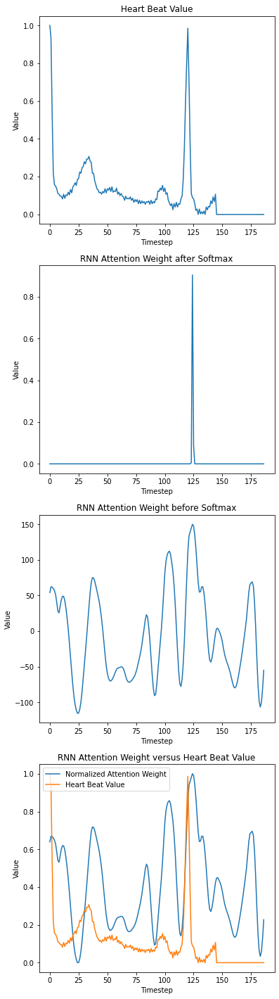

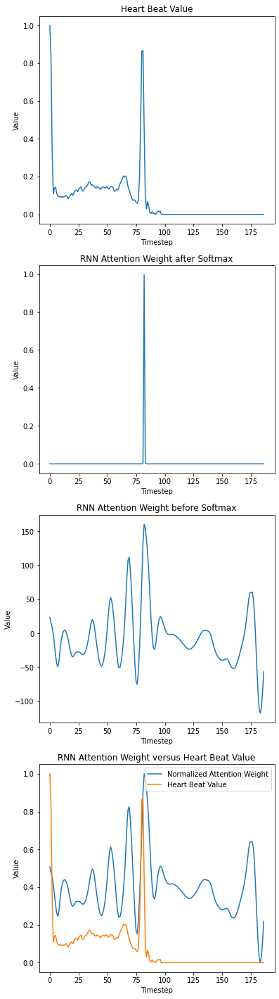

...

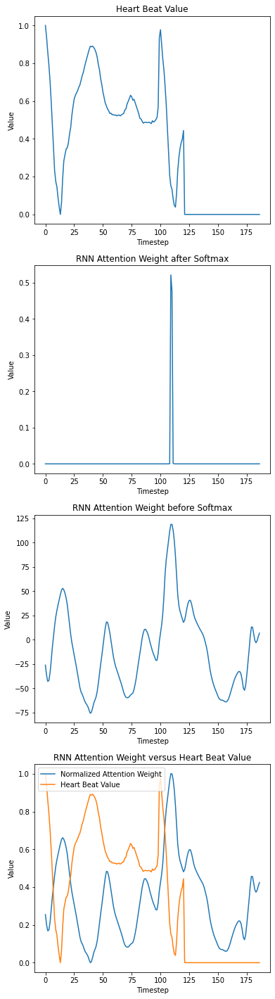

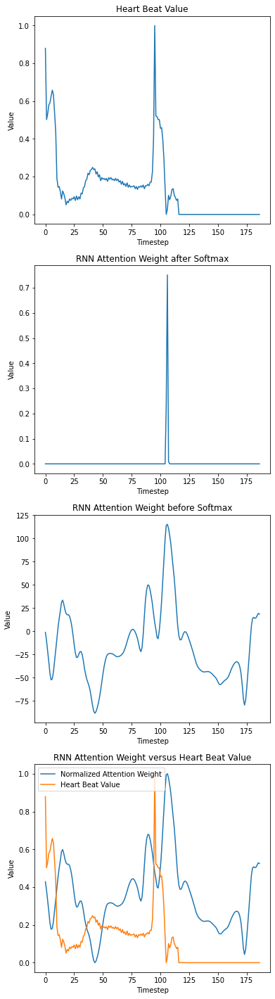

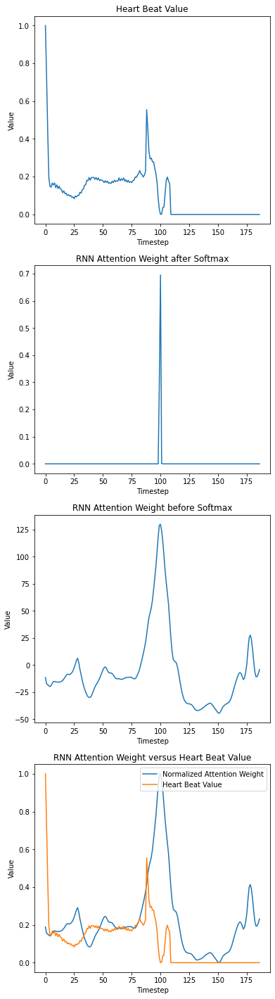

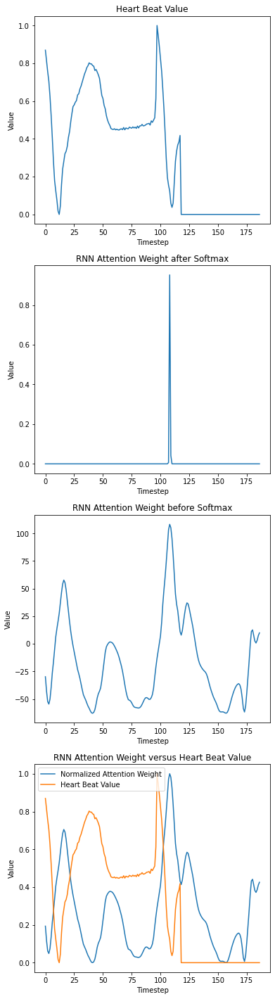

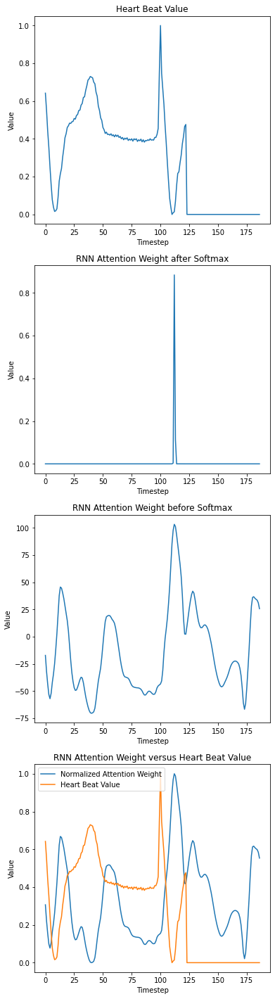

In [29]:
np.random.seed(8)
for label_class in range(5):
    label_indices = (label_for_viz_train==label_class).nonzero()[0]
    label_folder = os.path.join(viz_folder,"plots","train",str(label_class))
    if not os.path.exists(label_folder):
        os.makedirs(label_folder)
    for ind in np.random.choice(label_indices,size=10,replace=False):
        viz_att_plots(ind,os.path.join(label_folder,"%d.png"%ind),data_for_viz_train)
        print(label_class,ind,label_for_viz_train[ind])

In [ ]:
# for i,label in enumerate(label_for_viz_test):
#     label_folder = os.path.join(viz_folder,"plots","test",str(label))
#     if not os.path.exists(label_folder):
#         os.makedirs(label_folder)
#     viz_att_plots(i,os.path.join(label_folder,"%d.png"%i),data_for_viz_test)
#     plt.close()

0 17609 0
0 7719 0
0 7656 0
0 9541 0
0 1302 0
0 14116 0
0 526 0
0 17735 0
0 10031 0
0 2595 0
1 18620 1
1 18644 1
1 18580 1
1 18535 1
1 18590 1
1 18177 1
1 18357 1
1 18669 1
1 18191 1
1 18636 1


/tmp/ipykernel_2168550/1056424790.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(6,25))


2 18701 2
2 19004 2
2 19982 2
2 18816 2
2 20022 2
2 19143 2
2 19253 2
2 19024 2
2 19489 2
2 19798 2
3 20230 3
3 20164 3
3 20277 3
3 20167 3
3 20276 3
3 20226 3
3 20153 3
3 20215 3
3 20130 3
3 20265 3
4 21024 4
4 20791 4
4 21272 4
4 20985 4
4 20331 4
4 20639 4
4 20485 4
4 21834 4
4 20641 4
4 20716 4


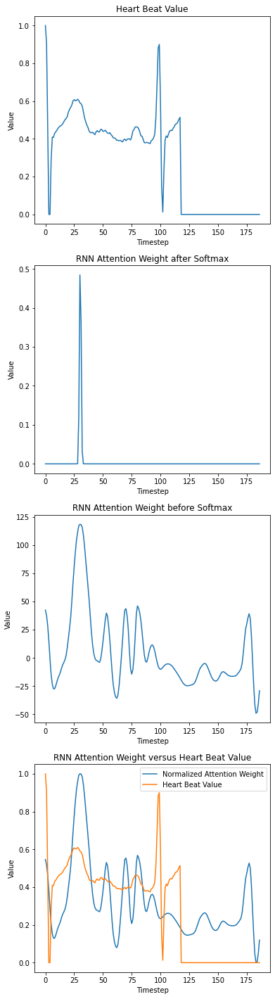

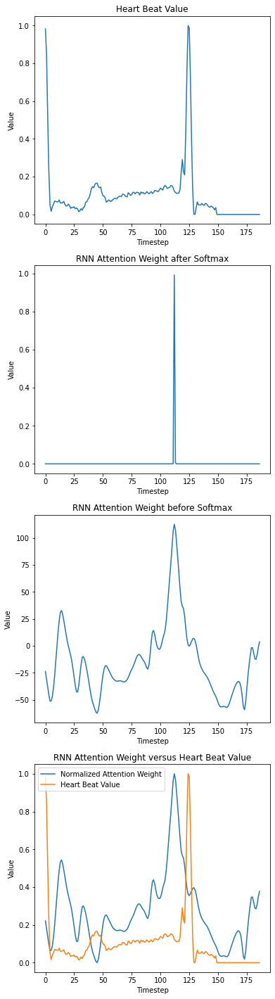

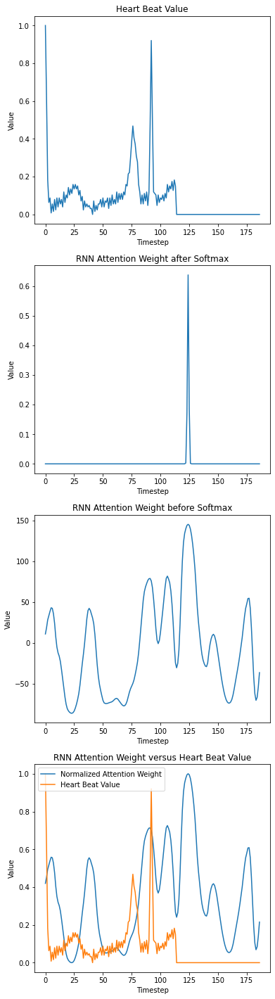

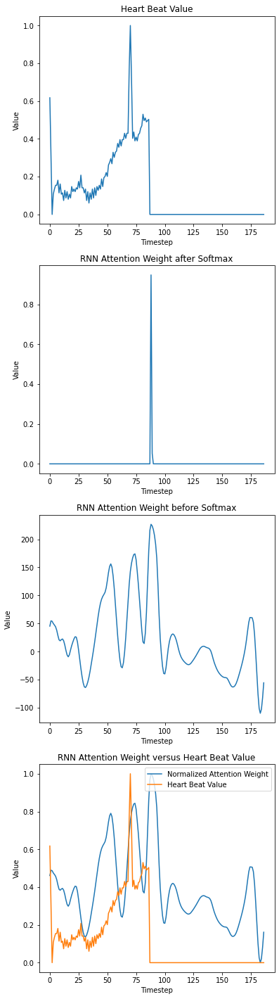

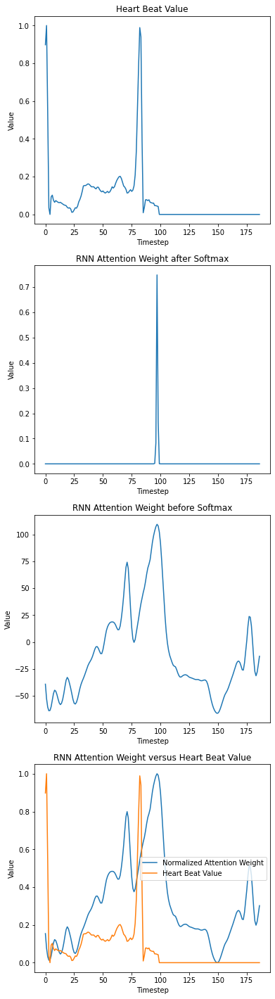

...

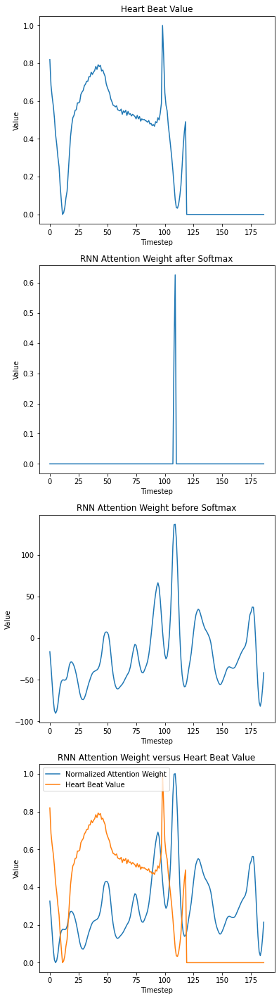

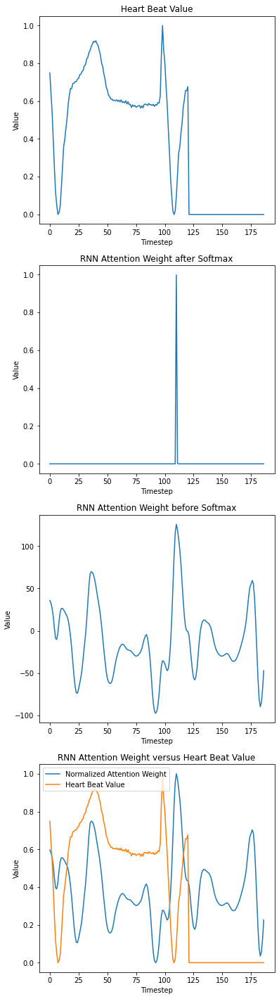

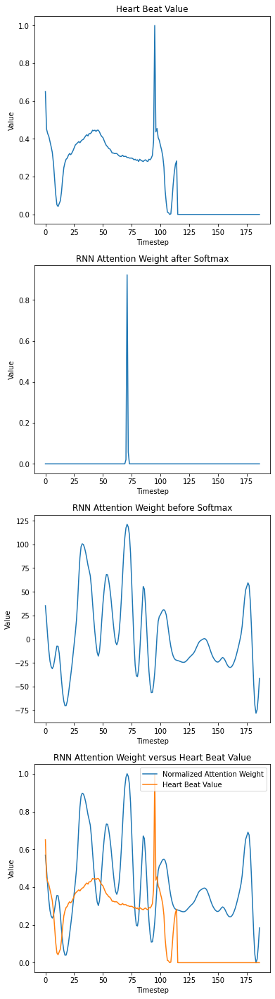

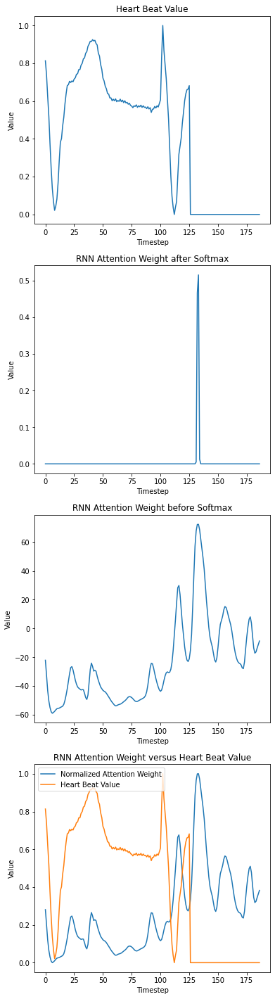

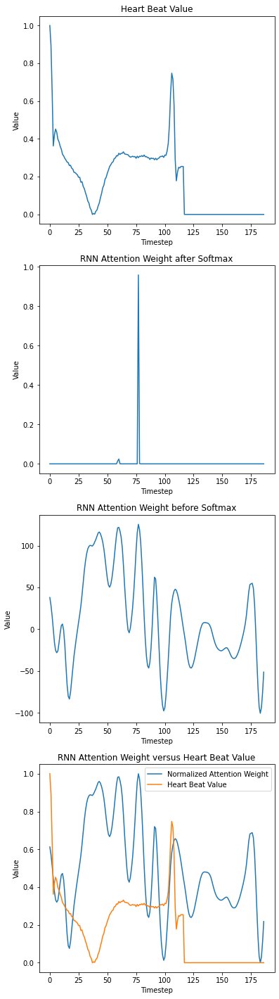

In [30]:
np.random.seed(8)
for label_class in range(5):
    label_indices = (label_for_viz_test==label_class).nonzero()[0]
    label_folder = os.path.join(viz_folder,"plots","test",str(label_class))
    if not os.path.exists(label_folder):
        os.makedirs(label_folder)
    for ind in np.random.choice(label_indices,size=10,replace=False):
        viz_att_plots(ind,os.path.join(label_folder,"%d.png"%ind),data_for_viz_test)
        print(label_class,ind,label_for_viz_test[ind])

# Downstream Task

In [31]:
import os
viz_folder = "attention_viz/lstm_att"
no_total_features = 187
percent_kept_top_features = 10 # Downstream task (zero out)
no_kept_top_features = int(percent_kept_top_features / 100 * no_total_features)
print("keep",no_kept_top_features)

keep 18


In [32]:
train_no_zero_out = torch.load(os.path.join(viz_folder,data_for_viz_file_name + "_train")).cpu().detach().numpy()
train_labels = torch.load(os.path.join(viz_folder,label_for_viz_file_name + "_train")).cpu().detach().numpy()

test_no_zero_out = torch.load(os.path.join(viz_folder,data_for_viz_file_name + "_test")).cpu().detach().numpy()
test_labels = torch.load(os.path.join(viz_folder,label_for_viz_file_name + "_test")).cpu().detach().numpy()


## Randomly zero out time points and keep k% of the time points

In [33]:
np.random.seed(8)
train_rand_zero_out = train_no_zero_out.copy()
#train_rand_zero_out[1000:1005,50:150]
for i in range(train_rand_zero_out.shape[0]):
    rand_indices = np.random.choice(train_rand_zero_out.shape[1],train_rand_zero_out.shape[1]-no_kept_top_features,replace=False)
    train_rand_zero_out[i,rand_indices] = 0

In [201]:
np.sum(train_rand_zero_out==0,axis=1)

array([140, 126, 140, ..., 141, 127, 116])

In [34]:
np.random.seed(12)
test_rand_zero_out = test_no_zero_out.copy()
test_labels = torch.load(os.path.join(viz_folder,label_for_viz_file_name + "_test")).cpu().detach().numpy()
#test_rand_zero_out[1000:1005,50:150],test_rand_zero_out.shape
for i in range(test_rand_zero_out.shape[0]):
    rand_indices = np.random.choice(test_rand_zero_out.shape[1],test_rand_zero_out.shape[1]-no_kept_top_features,replace=False)
    test_rand_zero_out[i,rand_indices] = 0

In [35]:
rf = sklearn.ensemble.RandomForestClassifier(verbose=True)

In [36]:
rf.fit(train_rand_zero_out,train_labels)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  1.6min finished


RandomForestClassifier(verbose=True)

In [37]:
rand_test_preds = rf.predict(test_rand_zero_out)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.1s finished


In [38]:
true = test_labels
pred = rand_test_preds
average_metric = 'macro'
print("Confusion matrix")
print(confusion_matrix(y_true=true, y_pred=pred))
print(f"Accuracy: {accuracy_score(true, pred)}")
print(f"Precision: {precision_score(true, pred, average=average_metric)}")
print(f"Recall: {recall_score(true, pred, average=average_metric)}")
print(f"F1: {f1_score(true, pred, average=average_metric)}")

Confusion matrix
[[18008     1    30     0    79]
 [  544     3     6     0     3]
 [ 1200     1   185     0    62]
 [  154     0     6     0     2]
 [  958     0    11     0   639]]
Accuracy: 0.8603599488397589
Precision: 0.6108874320311533
Recall: 0.30489497275896127
F1: 0.33762415725771033


/zfsauton2/home/jjlong/miniconda3/envs/algotradingdaily/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Train rf classifier on all the training data with no zeroing out

In [54]:
rf_no_zero_out = sklearn.ensemble.RandomForestClassifier(verbose=True)

In [55]:
rf_no_zero_out.fit(train_no_zero_out,train_labels)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  1.6min finished


RandomForestClassifier(verbose=True)

In [56]:
no_zero_test_preds = rf.predict(test_no_zero_out)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.4s finished


In [57]:
true = test_labels
pred = no_zero_test_preds
average_metric = 'macro'
print("Confusion matrix")
print(confusion_matrix(y_true=true, y_pred=pred))
print(f"Accuracy: {accuracy_score(true, pred)}")
print(f"Precision: {precision_score(true, pred, average=average_metric)}")
print(f"Recall: {recall_score(true, pred, average=average_metric)}")
print(f"F1: {f1_score(true, pred, average=average_metric)}")

Confusion matrix
[[18102     6     7     0     3]
 [  228   326     1     0     1]
 [  160     1  1270    13     4]
 [   53     0    11    98     0]
 [   96     0     3     0  1509]]
Accuracy: 0.9731865521651745
Precision: 0.9621499746658475
Recall: 0.8011781532404353
F1: 0.8658159175595976


## Zero out all the time points except for the k% of time points that have the highest attention weights

In [44]:
### Zero-out for training set
print(no_kept_top_features)
train_att_zero_out = torch.load(os.path.join(viz_folder,data_for_viz_file_name + "_train"))
train_labels = torch.load(os.path.join(viz_folder,label_for_viz_file_name + "_train")).detach().cpu().numpy()
w_attn_before_softmax_train = torch.load(os.path.join(viz_folder,w_attn_before_softmax_file_name + "_train"))
_, indices_train = w_attn_before_softmax_train.topk(no_total_features, axis=1)

# indices for zero-out = indices_train[:, no_kept_top_features:]
train_att_zero_out.scatter_(index=indices_train[:, no_kept_top_features:], dim=1, value=0)

18


tensor([[1.0000, 0.9841, 0.5023,  ..., 0.0000, 0.0000, 0.0000],
        [1.0000, 0.5625, 0.3777,  ..., 0.0000, 0.0000, 0.0000],
        [0.8740, 0.7297, 0.4934,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9899, 1.0000, 0.6351,  ..., 0.0000, 0.0000, 0.0000],
        [1.0000, 0.8152, 0.3551,  ..., 0.0000, 0.0000, 0.0000],
        [1.0000, 0.6165, 0.0602,  ..., 0.0000, 0.0000, 0.0000]],
       device='cuda:0')

In [45]:
### Zero-out for test set
test_att_zero_out = torch.load(os.path.join(viz_folder,data_for_viz_file_name + "_test"))
test_labels = torch.load(os.path.join(viz_folder,label_for_viz_file_name + "_test")).detach().cpu().numpy()
w_attn_before_softmax_test = torch.load(os.path.join(viz_folder,w_attn_before_softmax_file_name + "_test"))
_, indices_test = w_attn_before_softmax_test.topk(no_total_features, axis=1)

# indices for zero-out = indices_test[:, no_kept_top_features:]
test_att_zero_out.scatter_(index=indices_test[:, no_kept_top_features:], dim=1, value=0)

tensor([[1.0000, 0.7583, 0.1116,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.7839, 0.5311,  ..., 0.0000, 0.0000, 0.0000],
        [0.7301, 0.2124, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [1.0000, 0.9674, 0.6202,  ..., 0.0000, 0.0000, 0.0000],
        [0.9841, 0.5675, 0.6071,  ..., 0.0000, 0.0000, 0.0000],
        [0.9740, 0.9132, 0.8655,  ..., 0.0000, 0.0000, 0.0000]],
       device='cuda:0')

In [46]:
train_att_zero_out_np = train_att_zero_out.cpu().detach().numpy()

In [47]:
test_att_zero_out_np = test_att_zero_out.cpu().detach().numpy()

In [220]:
(test_labels==4).nonzero()

(array([20284, 20285, 20286, ..., 21889, 21890, 21891]),)

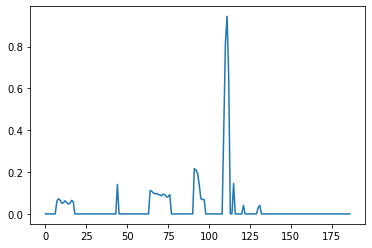

In [70]:
plt.plot(np.arange(187),train_att_zero_out_np[20284,:])

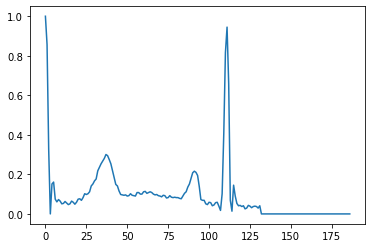

In [71]:
plt.plot(np.arange(187),train_no_zero_out[20284,:])

In [181]:
data_for_viz_train_np.shape

(70044, 187)

In [182]:
np.sum(data_for_viz_train_np==0,axis=1)

array([149, 141, 175, ..., 149,  99, 123])

In [48]:
rf_topk_att = sklearn.ensemble.RandomForestClassifier(verbose=True)

In [49]:
rf_topk_att.fit(train_att_zero_out_np,train_labels)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   38.9s finished


RandomForestClassifier(verbose=True)

In [50]:
topk_att_test_preds = rf_topk_att.predict(test_att_zero_out_np)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished


In [51]:
true = test_labels
pred = topk_att_test_preds
average_metric = 'macro'
print("Confusion matrix")
print(confusion_matrix(y_true=true, y_pred=pred))
print(f"Accuracy: {accuracy_score(true, pred)}")
print(f"Precision: {precision_score(true, pred, average=average_metric)}")
print(f"Recall: {recall_score(true, pred, average=average_metric)}")
print(f"F1: {f1_score(true, pred, average=average_metric)}")

Confusion matrix
[[17919    37   156     0     6]
 [  227   292    37     0     0]
 [  225     4  1201     9     9]
 [   63     0    14    85     0]
 [  126     0     7     0  1475]]
Accuracy: 0.9579755161702905
Precision: 0.9170583389768423
Recall: 0.757119221717606
F1: 0.8178571414711305


In [39]:
for percent_kept_top_features in [50,75,25,10]:
    no_total_features = 187
    #percent_kept_top_features = 10 # Downstream task (zero out)
    no_kept_top_features = int(percent_kept_top_features / 100 * no_total_features)

    ### Zero-out for training set
    print(no_kept_top_features)
    train_att_zero_out = torch.load(os.path.join(viz_folder,data_for_viz_file_name + "_train"))
    train_labels = torch.load(os.path.join(viz_folder,label_for_viz_file_name + "_train")).detach().cpu().numpy()
    w_attn_before_softmax_train = torch.load(os.path.join(viz_folder,w_attn_before_softmax_file_name + "_train"))
    _, indices_train = w_attn_before_softmax_train.topk(no_total_features, axis=1)

    # indices for zero-out = indices_train[:, no_kept_top_features:]
    train_att_zero_out.scatter_(index=indices_train[:, no_kept_top_features:], dim=1, value=0)
    
    ### Zero-out for test set
    test_att_zero_out = torch.load(os.path.join(viz_folder,data_for_viz_file_name + "_test"))
    test_labels = torch.load(os.path.join(viz_folder,label_for_viz_file_name + "_test")).detach().cpu().numpy()
    w_attn_before_softmax_test = torch.load(os.path.join(viz_folder,w_attn_before_softmax_file_name + "_test"))
    _, indices_test = w_attn_before_softmax_test.topk(no_total_features, axis=1)

    # indices for zero-out = indices_test[:, no_kept_top_features:]
    test_att_zero_out.scatter_(index=indices_test[:, no_kept_top_features:], dim=1, value=0)
    
    train_att_zero_out_np = train_att_zero_out.cpu().detach().numpy()
    test_att_zero_out_np = test_att_zero_out.cpu().detach().numpy()
    
    rf_topk_att = sklearn.ensemble.RandomForestClassifier(verbose=True)
    rf_topk_att.fit(train_att_zero_out_np,train_labels)
    topk_att_test_preds = rf_topk_att.predict(test_att_zero_out_np)
    
    true = test_labels
    pred = topk_att_test_preds
    average_metric = 'macro'
    print("Confusion matrix",percent_kept_top_features)
    print(confusion_matrix(y_true=true, y_pred=pred))
    print(f"Accuracy: {accuracy_score(true, pred)}")
    print(f"Precision: {precision_score(true, pred, average=average_metric)}")
    print(f"Recall: {recall_score(true, pred, average=average_metric)}")
    print(f"F1: {f1_score(true, pred, average=average_metric)}")

93


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  1.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Confusion matrix 50
[[18095     4     8     0    11]
 [  232   315     6     0     3]
 [  213     0  1216    11     8]
 [   46     0     8   108     0]
 [  111     0     6     0  1491]]
Accuracy: 0.9695322492234606
Precision: 0.9651554950360278
Recall: 0.7997923569923567
F1: 0.8661174048627132
140


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  1.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Confusion matrix 75
[[18103     2    12     0     1]
 [  227   320     8     0     1]
 [  202     0  1224    13     9]
 [   47     0    11   104     0]
 [  109     0     1     0  1498]]
Accuracy: 0.9706285401059748
Precision: 0.9637213791451085
Recall: 0.798716575648345
F1: 0.8649306948931864
46


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   51.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Confusion matrix 25
[[18081     3    28     0     6]
 [  233   311     8     0     4]
 [  236     1  1188    13    10]
 [   50     0     9   103     0]
 [  100     0     5     0  1503]]
Accuracy: 0.9677507765393751
Precision: 0.9577222638022713
Recall: 0.7896512601198579
F1: 0.8563949840841412
18


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   33.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Confusion matrix 10
[[18032    16    41     5    24]
 [  240   303    11     1     1]
 [  302     6  1107    12    21]
 [   54     1    10    97     0]
 [  122     0     8     0  1478]]
Accuracy: 0.9600310615750046
Precision: 0.9289951632439033
Recall: 0.7645279582766138
F1: 0.8305725514932585


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
